# Clothes segmentation

Runtime -> Change runtime type -> A100 GPU before running anything.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:

!git clone https://github.com/roaa108/Clothes_Segmentation.git
%cd Clothes_Segmentation
!pip install -q -r requirements.txt

Cloning into 'Clothes_Segmentation'...
remote: Enumerating objects: 20, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 20 (delta 4), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (20/20), 9.98 KiB | 9.98 MiB/s, done.
Resolving deltas: 100% (4/4), done.
/content/Clothes_Segmentation
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 71.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.9/274.9 kB 32.4 MB/s eta 0:00:00


In [3]:
# optional, makes the Hugging Face download faster
import os
from google.colab import userdata
from huggingface_hub import login

os.environ['HF_TOKEN'] = userdata.get('HF_TOKEN')
login(token=os.environ['HF_TOKEN'])

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


In [4]:
import os

archive = '/content/drive/MyDrive/clothes_seg/atr.tar'

!mkdir -p /content/drive/MyDrive/clothes_seg data

if os.path.exists(archive):
    print('cached archive found on Drive, extracting')
    !tar -xf "{archive}" -C data
else:
    print('no cache yet, downloading from Hugging Face')
    !python download_data.py
    print('archiving to Drive so the next session skips the download')
    !tar -cf "{archive}" -C data atr

no cache yet, downloading from Hugging Face
README.md: 100% 2.23k/2.23k [00:00<00:00, 4.52MB/s]

data/train-00000-of-00002.parquet: downloading bytes:   0% 0.00/371M [00:00<?, ?B/s]
data/train-00000-of-00002.parquet: downloading bytes:   5% 17.7M/371M [00:02<00:28, 12.5MB/s,  858kB/s  ]
data/train-00000-of-00002.parquet: downloading bytes:  10% 38.9M/371M [00:03<00:09, 35.7MB/s, 2.46MB/s  ]
data/train-00000-of-00002.parquet: reconstructing file:   0% 1.30M/371M [00:03<13:00, 474kB/s, 99.6kB/s  ]
data/train-00000-of-00002.parquet: downloading bytes:  14% 51.0M/371M [00:03<00:10, 29.9MB/s, 4.17MB/s  ]
data/train-00000-of-00002.parquet: downloading bytes:  16% 58.6M/371M [00:03<00:10, 28.5MB/s, 4.79MB/s  ]
data/train-00000-of-00002.parquet: downloading bytes:  19% 69.1M/371M [00:04<00:08, 33.8MB/s, 5.34MB/s  ]
data/train-00000-of-00002.parquet: downloading bytes:  23% 85.1M/371M [00:04<00:07, 36.7MB/s, 6.79MB/s  ]
data/train-00000-of-00002.parquet: downloading bytes:  25% 94.1M/371M [00:0

In [5]:
!du -sh data/atr
!python dataset.py

5.7G	data/atr
/usr/local/lib/python3.13/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.24). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
16706 1000 200
torch.Size([16, 3, 256, 256]) torch.Size([16, 256, 256]) torch.int64
background 0.9056
upper 0.0505
lower 0.0237
dress 0.0202


In [6]:
!mkdir -p checkpoints/unet results
!python -m experiments.train_unet

/usr/local/lib/python3.13/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.24). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
config.json: 100% 156/156 [00:00<00:00, 861kB/s]

model.safetensors: downloading bytes:  64% 55.5M/87.3M [00:01<00:00, 58.4MB/s, 3.50MB/s  ]
model.safetensors: downloading bytes: 100% 80.6M/80.6M [00:01<00:00, 41.1MB/s, 7.60MB/s  ]
model.safetensors: reconstructing file: 100% 87.3M/87.3M [00:01<00:00, 44.5MB/s, 8.36MB/s  ]
Epoch 1/40 | Train loss: 0.6234 | Validation loss: 0.3308 | Garment IoU: 0.6131
Epoch 2/40 | Train loss: 0.3432 | Validation loss: 0.2769 | Garment IoU: 0.6559
Epoch 3/40 | Train loss: 0.3070 | Validation loss: 0.2543 | Garment IoU: 0.6745
Epoch 4/40 | Train loss: 0.2860 | Validation loss: 0.2660 | Garment IoU: 0.6581
Epoch 5/40 | Train loss: 0.2688 | Va

In [7]:
!python evaluate.py

/usr/local/lib/python3.13/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.24). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
{
  "epoch": 31,
  "test_metrics": {
    "iou_background": 0.9863656759262085,
    "dice_background": 0.993135929107666,
    "iou_upper": 0.869208574295044,
    "dice_upper": 0.9300284385681152,
    "iou_lower": 0.899959921836853,
    "dice_lower": 0.9473462104797363,
    "iou_dress": 0.18264032900333405,
    "dice_dress": 0.30886876583099365,
    "garment_iou": 0.6506029367446899,
    "garment_dice": 0.7287478446960449,
    "pixel_accuracy": 0.9765049815177917,
    "total_loss": 0.1695581700366277
  },
  "confusion_matrix": {
    "class_order": [
      "background",
      "upper",
      "lower",
      "dress"
    ],
    "rows_are_true": [
      [
        10422359,
       

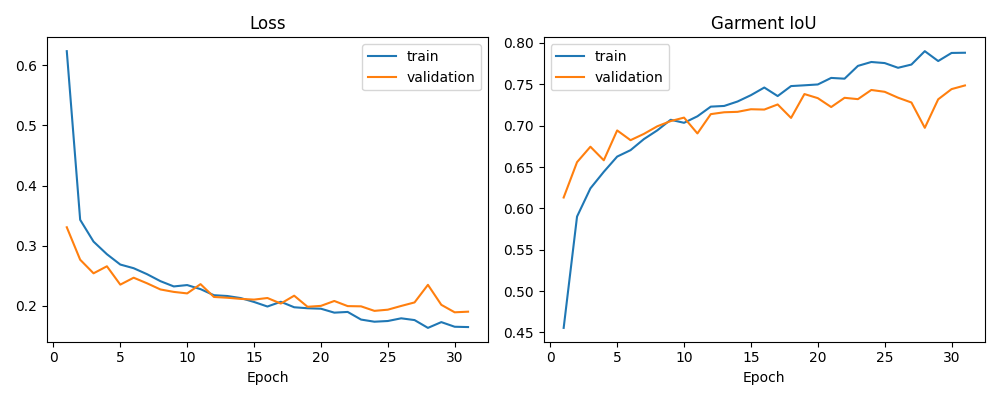

| Class | IoU | Dice |
|---|---:|---:|
| background | 0.9864 | 0.9931 |
| upper | 0.8692 | 0.9300 |
| lower | 0.9000 | 0.9473 |
| dress | 0.1826 | 0.3089 |
| **garment mean** | **0.6506** | **0.7287** |

Pixel accuracy: 0.9765



In [8]:
from IPython.display import Image, display

display(Image("results/metrics/training_curves.png"))
print(open("results/metrics/results_table.md").read())

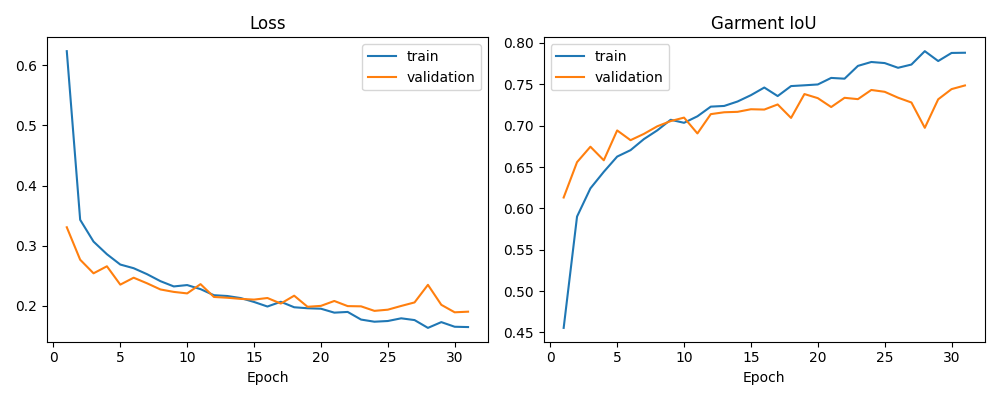

In [10]:
from IPython.display import Image as show
show('results/metrics/training_curves.png')

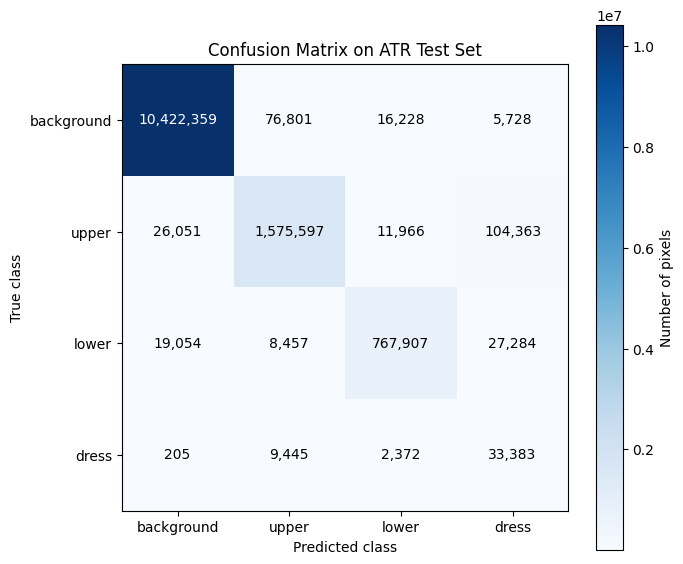

In [21]:
import json
import numpy as np
import matplotlib.pyplot as plt

with open("results/metrics/final_results.json") as file:
    results = json.load(file)

classes = results["confusion_matrix"]["class_order"]
matrix = np.array(results["confusion_matrix"]["rows_are_true"])

plt.figure(figsize=(7, 6))
plt.imshow(matrix, cmap="Blues")
plt.colorbar(label="Number of pixels")

plt.xticks(range(len(classes)), classes)
plt.yticks(range(len(classes)), classes)

plt.xlabel("Predicted class")
plt.ylabel("True class")
plt.title("Confusion Matrix on ATR Test Set")

for row in range(len(classes)):
    for column in range(len(classes)):
        plt.text(
            column,
            row,
            f"{matrix[row, column]:,}",
            ha="center",
            va="center",
            color="white" if matrix[row, column] > matrix.max() / 2 else "black",
        )

plt.tight_layout()
plt.savefig( 'results/Confusion Matrix', dpi=200)
plt.show()

Saving test img.jpg to test img (1).jpg
test img (1).jpg
  background: 84.2%
  upper: 7.0%
  lower: 8.8%
  dress: 0.0%


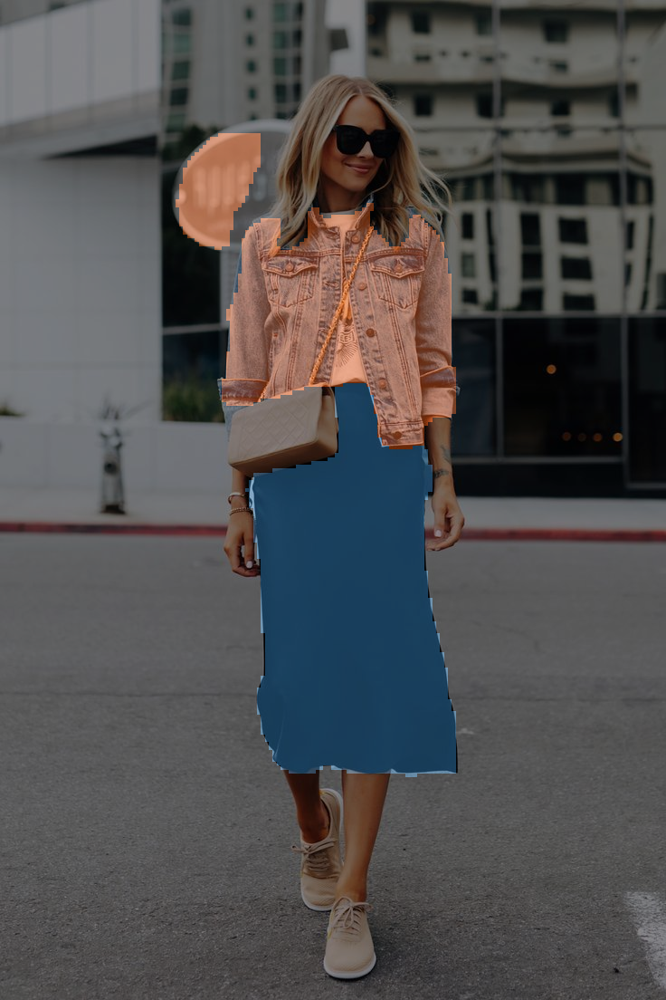

In [11]:
from google.colab import files
from IPython.display import display

from dataset import class_names
from inference import load_model, predict_mask, save_results

uploaded = files.upload()

model = load_model()

for name in uploaded:
    image, mask = predict_mask(model, name)

    stem = name.rsplit('.', 1)[0]
    save_results(image, mask, 'results/inference', stem)

    print(name)
    for index, class_name in enumerate(class_names):
        print(f'  {class_name}: {(mask == index).mean() * 100:.1f}%')

    display(show(f'results/inference/{stem}_overlay.png'))

Saving test 2.jpg to test 2.jpg
test 2.jpg
  background: 89.3%
  upper: 2.5%
  lower: 8.2%
  dress: 0.0%


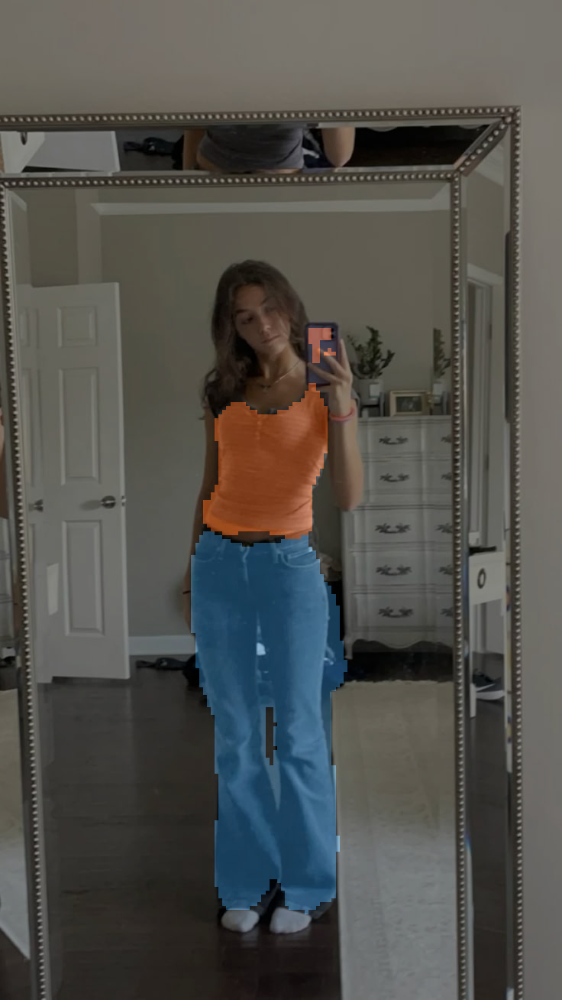

In [12]:
from google.colab import files
from IPython.display import display

from dataset import class_names
from inference import load_model, predict_mask, save_results

uploaded = files.upload()

model = load_model()

for name in uploaded:
    image, mask = predict_mask(model, name)

    stem = name.rsplit('.', 1)[0]
    save_results(image, mask, 'results/inference', stem)

    print(name)
    for index, class_name in enumerate(class_names):
        print(f'  {class_name}: {(mask == index).mean() * 100:.1f}%')

    display(show(f'results/inference/{stem}_overlay.png'))

Saving test 3.jpg to test 3.jpg
test 3.jpg
  background: 65.4%
  upper: 29.3%
  lower: 3.5%
  dress: 1.7%


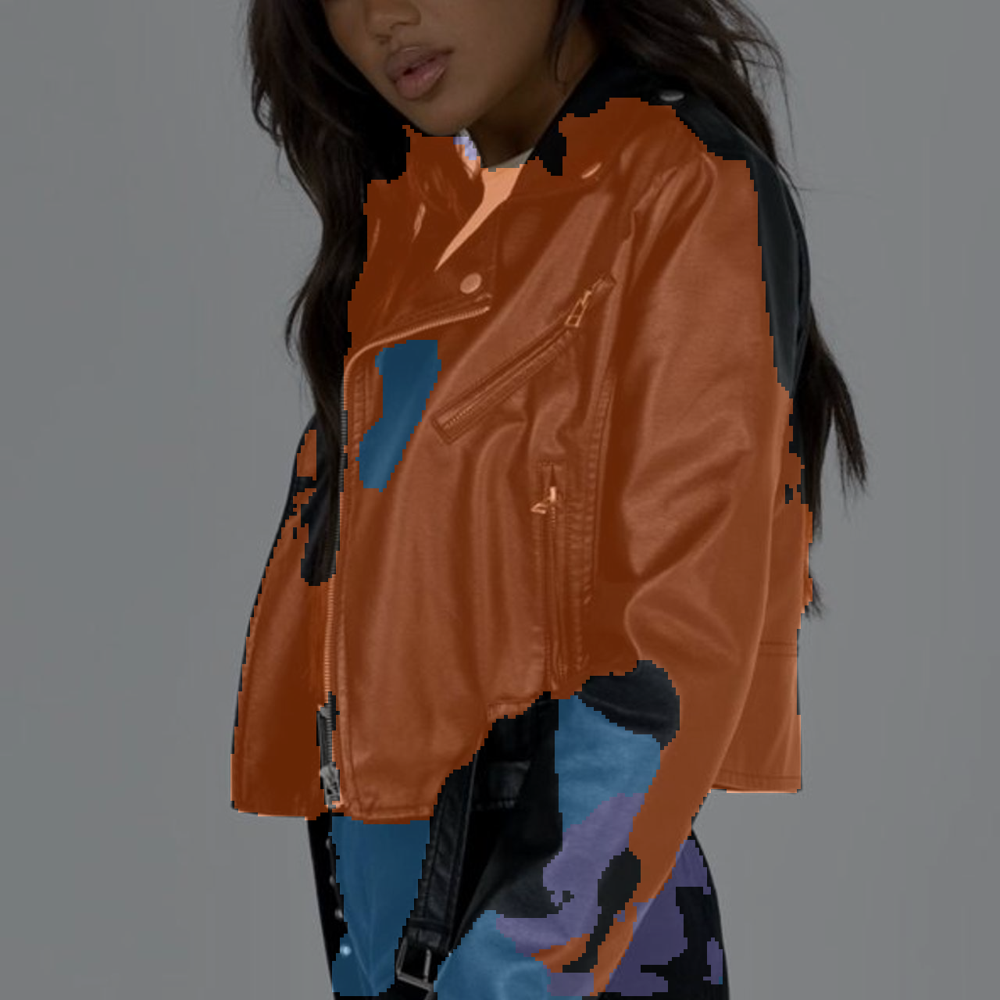

In [13]:
from google.colab import files
from IPython.display import display

from dataset import class_names
from inference import load_model, predict_mask, save_results

uploaded = files.upload()

model = load_model()

for name in uploaded:
    image, mask = predict_mask(model, name)

    stem = name.rsplit('.', 1)[0]
    save_results(image, mask, 'results/inference', stem)

    print(name)
    for index, class_name in enumerate(class_names):
        print(f'  {class_name}: {(mask == index).mean() * 100:.1f}%')

    display(show(f'results/inference/{stem}_overlay.png'))

Saving tst4.jpg to tst4.jpg
tst4.jpg
  background: 77.7%
  upper: 14.5%
  lower: 7.8%
  dress: 0.0%


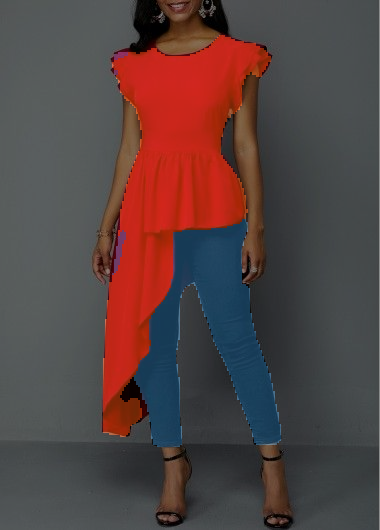

In [14]:
from google.colab import files
from IPython.display import display

from dataset import class_names
from inference import load_model, predict_mask, save_results

uploaded = files.upload()

model = load_model()

for name in uploaded:
    image, mask = predict_mask(model, name)

    stem = name.rsplit('.', 1)[0]
    save_results(image, mask, 'results/inference', stem)

    print(name)
    for index, class_name in enumerate(class_names):
        print(f'  {class_name}: {(mask == index).mean() * 100:.1f}%')

    display(show(f'results/inference/{stem}_overlay.png'))

Saving tst5.jpg to tst5.jpg
tst5.jpg
  background: 79.0%
  upper: 5.9%
  lower: 15.2%
  dress: 0.0%


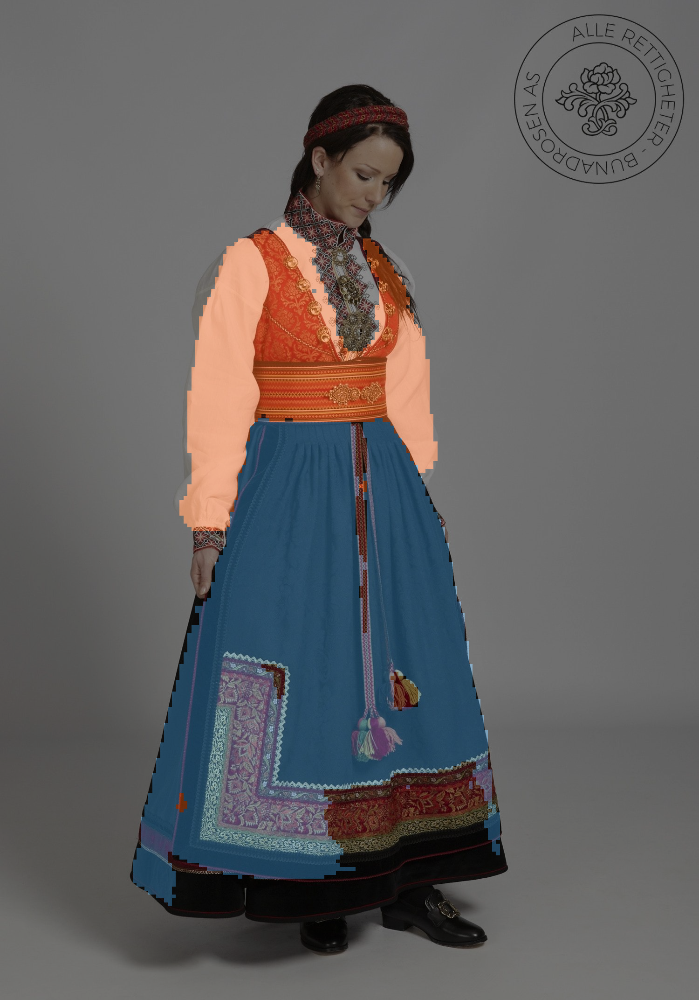

In [15]:
from google.colab import files
from IPython.display import display

from dataset import class_names
from inference import load_model, predict_mask, save_results

uploaded = files.upload()

model = load_model()

for name in uploaded:
    image, mask = predict_mask(model, name)

    stem = name.rsplit('.', 1)[0]
    save_results(image, mask, 'results/inference', stem)

    print(name)
    for index, class_name in enumerate(class_names):
        print(f'  {class_name}: {(mask == index).mean() * 100:.1f}%')

    display(show(f'results/inference/{stem}_overlay.png'))

Saving tst6.jpg to tst6.jpg
tst6.jpg
  background: 73.5%
  upper: 10.0%
  lower: 1.9%
  dress: 14.6%


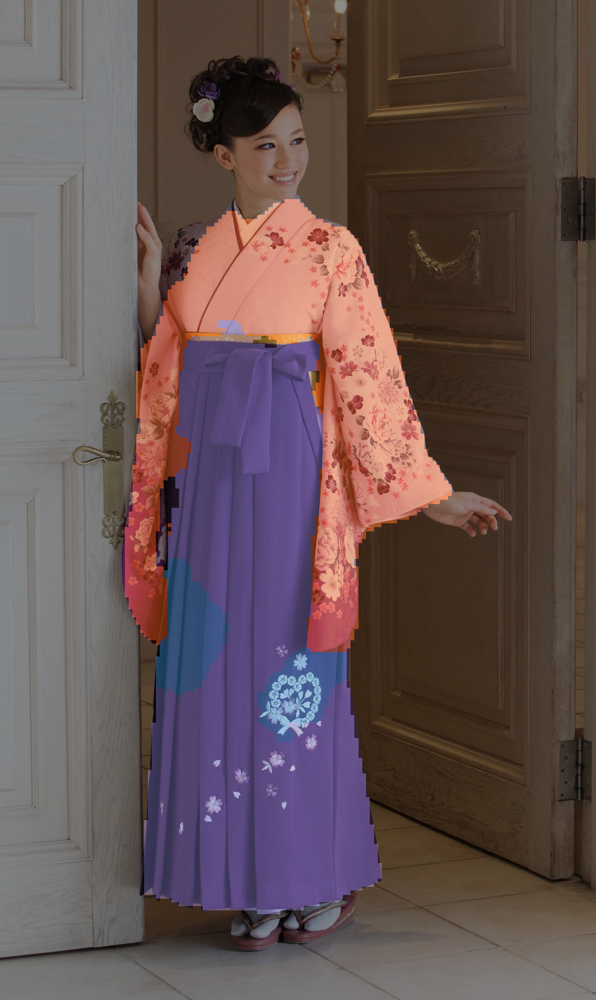

In [16]:
from google.colab import files
from IPython.display import display

from dataset import class_names
from inference import load_model, predict_mask, save_results

uploaded = files.upload()

model = load_model()

for name in uploaded:
    image, mask = predict_mask(model, name)

    stem = name.rsplit('.', 1)[0]
    save_results(image, mask, 'results/inference', stem)

    print(name)
    for index, class_name in enumerate(class_names):
        print(f'  {class_name}: {(mask == index).mean() * 100:.1f}%')

    display(show(f'results/inference/{stem}_overlay.png'))

Saving tst7.jpg to tst7.jpg
tst7.jpg
  background: 78.3%
  upper: 15.9%
  lower: 5.8%
  dress: 0.0%


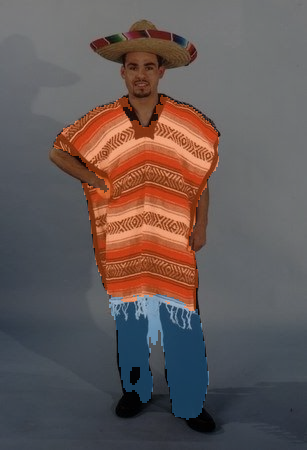

In [17]:
from google.colab import files
from IPython.display import display

from dataset import class_names
from inference import load_model, predict_mask, save_results

uploaded = files.upload()

model = load_model()

for name in uploaded:
    image, mask = predict_mask(model, name)

    stem = name.rsplit('.', 1)[0]
    save_results(image, mask, 'results/inference', stem)

    print(name)
    for index, class_name in enumerate(class_names):
        print(f'  {class_name}: {(mask == index).mean() * 100:.1f}%')

    display(show(f'results/inference/{stem}_overlay.png'))

Saving tst8.jpg to tst8.jpg
tst8.jpg
  background: 66.6%
  upper: 0.0%
  lower: 0.0%
  dress: 33.4%


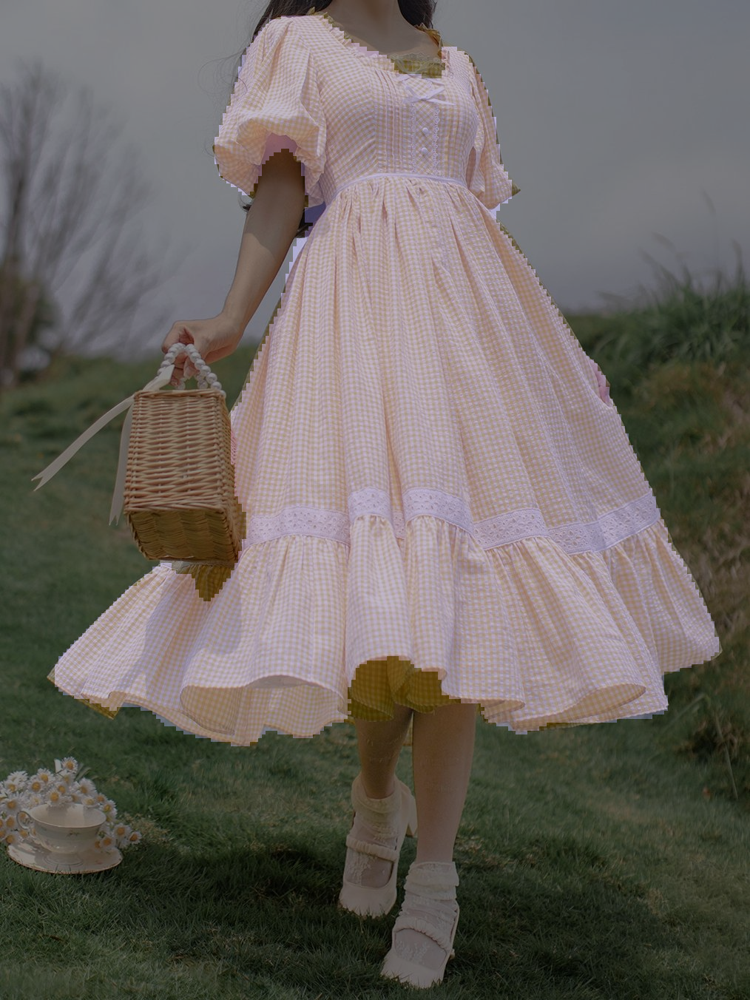

In [18]:
from google.colab import files
from IPython.display import display

from dataset import class_names
from inference import load_model, predict_mask, save_results

uploaded = files.upload()

model = load_model()

for name in uploaded:
    image, mask = predict_mask(model, name)

    stem = name.rsplit('.', 1)[0]
    save_results(image, mask, 'results/inference', stem)

    print(name)
    for index, class_name in enumerate(class_names):
        print(f'  {class_name}: {(mask == index).mean() * 100:.1f}%')

    display(show(f'results/inference/{stem}_overlay.png'))

# Download results to include in the report

In [22]:
!zip -r results.zip results

  adding: results/ (stored 0%)
  adding: results/.ipynb_checkpoints/ (stored 0%)
  adding: results/inference/ (stored 0%)
  adding: results/inference/tst6_overlay.png (deflated 0%)
  adding: results/inference/tst4_overlay.png (deflated 0%)
  adding: results/inference/test 2_overlay.png (deflated 0%)
  adding: results/inference/tst4_clothing_only.png (deflated 1%)
  adding: results/inference/tst8_overlay.png (deflated 0%)
  adding: results/inference/test img_overlay.png (deflated 0%)
  adding: results/inference/tst7_overlay.png (deflated 0%)
  adding: results/inference/tst8_clothing_only.png (deflated 1%)
  adding: results/inference/test 3_clothing_only.png (deflated 2%)
  adding: results/inference/test img_clothing_only.png (deflated 2%)
  adding: results/inference/test img (1)_mask.png (deflated 69%)
  adding: results/inference/tst7_mask.png (deflated 19%)
  adding: results/inference/tst7_clothing_only.png (deflated 1%)
  adding: results/inference/test 2_mask.png (deflated 74%)
  addi

In [23]:
from google.colab import files
files.download("results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>